## Содержание

[1. Описание проекта](#1)

[2. Предобработка данных](#2)

[3. Анализ данных](#3)

[4. Анализ кофеен](#4)

[5. Выводы](#5)

[ПОСМОТРЕТЬ И СКАЧАТЬ ПРЕЗЕНТАЦИЮ С ОТЧЕТОМ](https://disk.yandex.ru/i/t5BFKTcUs1_8tA)

## Описание проекта <a id=1></a>
Инвесторы рассматривают рынок общественного питания в Москве для открытия собственного заведения.
Для приняти решения необходимо подготовить исследование рынка общественного питания Москвы включающее информацию:
- о типах заведений
    - кафе,
    - ресторан, 
    - пиццерия,
    - паб или бар
- местах расположения, 
- меню и ценах
- найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Для анализа  доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках и носит исключительно справочный характер.

## Предобработка данных<a id=2></a>

In [1]:
import pandas as pd # загрузка необходимых библиотек
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import json
import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import plotly.graph_objects as go

In [2]:
try:# загрузка данных
    df = pd.read_csv('/datasets/moscow_places.csv')
except:
    df = pd.read_csv(r"C:\Users\takhi\Desktop\Яндекс академия\Базы к ноутбукам\История с помощью данных\moscow_places.csv")

In [3]:
df.tail(2)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0
8405,Kebab Time,кафе,"Москва, Россошанский проезд, 6",Южный административный округ,"ежедневно, круглосуточно",55.598229,37.604702,3.9,NaN,NaN,NaN,NaN,0,12.0


In [4]:
df.info()# общая информация по полученным данным

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
df['name'].value_counts()# названия и количество заведений

Кафе                           189
Шоколадница                    120
Домино'с Пицца                  76
Додо Пицца                      74
One Price Coffee                71
                              ... 
Курица и Утка по-Гонконгски      1
WoWфли                           1
Bright Israeli Grill             1
Айоку                            1
Forest Lounge                    1
Name: name, Length: 5614, dtype: int64

- имеется информация по 8406 заведениям, часть из которых является сетевыми

In [6]:
df.duplicated().sum()# проверка на дубликаты в данных

0

In [7]:
df.duplicated(['name', 'address']).sum()# проверим на дубликаты комбинацию столбцов адрес и название заведения

0

 - дубликатов в данных не выявлено

In [9]:
dups = df.groupby(['name', 'category'],as_index=False)['district'].count()
dups[dups['district']>1]


,name,category,district
4,10 Идеальных Пицц,ресторан,3
14,18 Грамм,кофейня,3
38,7 Сэндвичей,кофейня,4
42,8 Вафель,кафе,2
48,9 Bar Coffee,кофейня,7
...,...,...,...
6017,Ян Примус,ресторан,2
6019,Яндекс Лавка,ресторан,69
6020,Яндекс.Лавка,ресторан,3
6024,Японская кухня,кафе,2


In [10]:
df.isna().mean()# проверка на пропуски данных

name                 0.000000
category             0.000000
address              0.000000
district             0.000000
hours                0.063764
lat                  0.000000
lng                  0.000000
rating               0.000000
price                0.605639
avg_bill             0.546039
middle_avg_bill      0.625387
middle_coffee_cup    0.936355
chain                0.000000
seats                0.429574
dtype: float64

### Выводы
По некоторым характеристикам данные не полные.
- по ценовой категории заведения нет данных в 60%
- по среднему чеку данные отсутствуют  62%
- по цене в 60%
- стоимости чашки кофе в 94%
- количеству мест в 43%

Пока не будем удалять и заполнять пропущенные данные

In [11]:
df['street'] = df['address'].apply(lambda x: x.split(',')[1])# из адреса выделим информацию только по улице

In [12]:
df['hours'].value_counts()# все возможные варианты работы заведений

ежедневно, 10:00–22:00                                  759
ежедневно, круглосуточно                                730
ежедневно, 11:00–23:00                                  396
ежедневно, 10:00–23:00                                  310
ежедневно, 12:00–00:00                                  254
                                                       ... 
пн-пт 08:00–20:00; сб 09:00–15:00                         1
пн-чт 12:00–03:00; пт,сб 12:00–05:00; вс 12:00–03:00      1
пн-пт 09:00–00:00; сб,вс 09:00–02:00                      1
пн-пт 07:45–21:00; сб,вс 10:00–20:00                      1
пн-чт 09:00–01:00; пт,сб 09:00–06:00; вс 09:00–01:00      1
Name: hours, Length: 1307, dtype: int64

In [13]:
df['is_24/7'] = df['hours'].str.contains('круглосуточно')
# выделим стобец для на разделения заведений на круглосуточные и остальные

In [14]:
df['low_rating'] = df['rating'].apply(lambda x: x <=3)
# выделим стобец для на разделения заведений по рейтингу

## Анализ данных

### Задача <a id=3></a>
- Какие категории заведений представлены в данных?
- Количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее.
- Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.

In [15]:
df['category'].value_counts()

кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

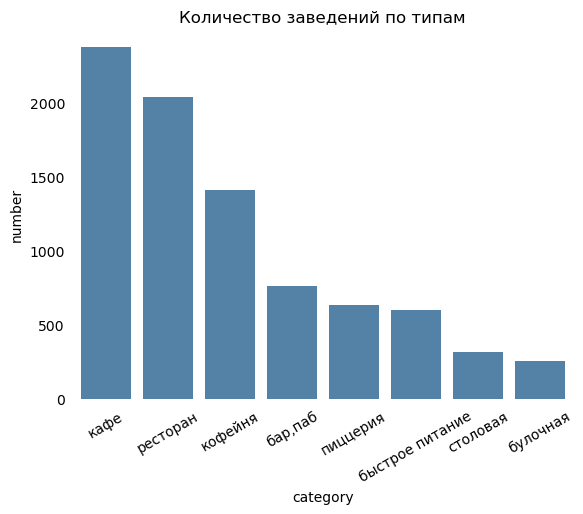

In [17]:
# график у seaborn без рамки
cats = df.pivot_table(index='category',values='chain', aggfunc='count').sort_values(by='chain', ascending=False)
sns.barplot(x=cats.index, y=cats['chain'], color='steelblue')

plt.xticks(rotation=30)
plt.tick_params(axis='x', which='both', bottom=False,
                top=False, labelbottom=True)
  
# Selecting the axis-Y making the right and left axes False
plt.tick_params(axis='y', which='both', right=False,
                left=False, labelleft=True)
  
# Iterating over all the axes in the figure
# and make the Spines Visibility as False
for pos in ['right', 'top', 'bottom', 'left']:
    plt.gca().spines[pos].set_visible(False)
plt.ylabel('number')
plt.title('Количество заведений по типам')
plt.show()


In [18]:
#круговая диаграмма
fig = px.pie(cats, values='chain', names=cats.index, title='Количество заведений по типам')
fig.show()

In [19]:
df['category'].value_counts(normalize=True)# проверим правильность данных на диаграмме

кафе               0.282893
ресторан           0.243041
кофейня            0.168094
бар,паб            0.091006
пиццерия           0.075303
быстрое питание    0.071734
столовая           0.037473
булочная           0.030454
Name: category, dtype: float64

In [20]:
df['category'].value_counts(normalize=True).reset_index().round(2)

,index,category
0,кафе,0.28
1,ресторан,0.24
2,кофейня,0.17
3,"бар,паб",0.09
4,пиццерия,0.08
5,быстрое питание,0.07
6,столовая,0.04
7,булочная,0.03


### Выводы
- на рынке представлено 8 типов заведений
- самыми распространенными являются кафе, рестораны и кофейни
- самую маленькую долю по числу заведений имеют булочные и столовые

### Задача
- количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее.
- Постройте визуализации.
- Проанализируйте результаты и сделайте выводы.

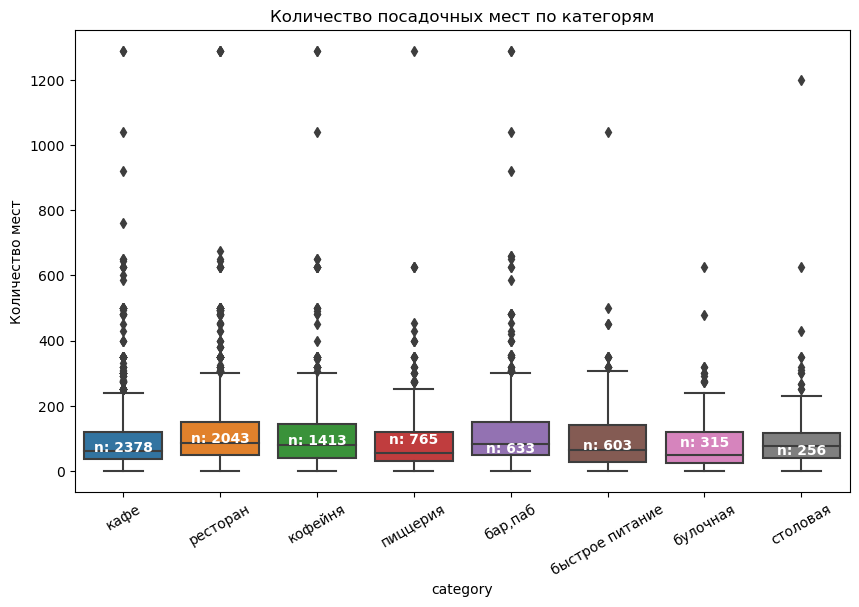

In [21]:
params = df.groupby('category').agg({'name':'count', 'seats':'median'}).sort_values('name', ascending=False)
plt.figure(figsize=(10,6))
ax = sns.boxplot(x='category', y='seats', data=df)
medians = params['seats'].values
nobs = params['name'].values
nobs = [str(x) for x in nobs]
nobs = ['n: ' + i for i in nobs]
pos = range(len(nobs))
for tick,label in zip(pos,ax.get_xticklabels()):
    plt.text(pos[tick], medians[tick] + 0.6, nobs[tick], horizontalalignment='center', size='medium', color='w', weight='semibold')

plt.ylabel('Количество мест')
plt.title('Количество посадочных мест по категорям')
plt.xticks(rotation=30)
plt.show()

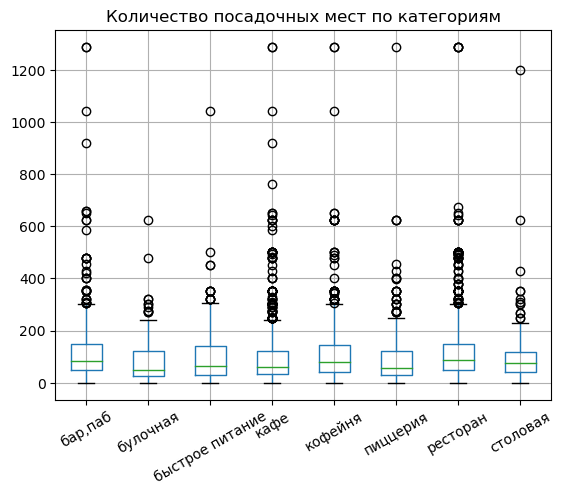

In [22]:
df.pivot(columns='category', values='seats').boxplot()
plt.xticks(rotation=30)
plt.title('Количество посадочных мест по категориям')
plt.show()

In [23]:
seats = df.groupby('category').agg({'seats':[np.mean, np.median]})
seats['seats','mean'] = seats['seats','mean'].round()
seats.columns=['mean','median']
seats.sort_values(by='median', ascending=False)

,mean,median
category,,
ресторан,122.0,86.0
"бар,паб",125.0,82.5
кофейня,111.0,80.0
столовая,100.0,75.5
быстрое питание,99.0,65.0
кафе,98.0,60.0
пиццерия,94.0,55.0
булочная,89.0,50.0


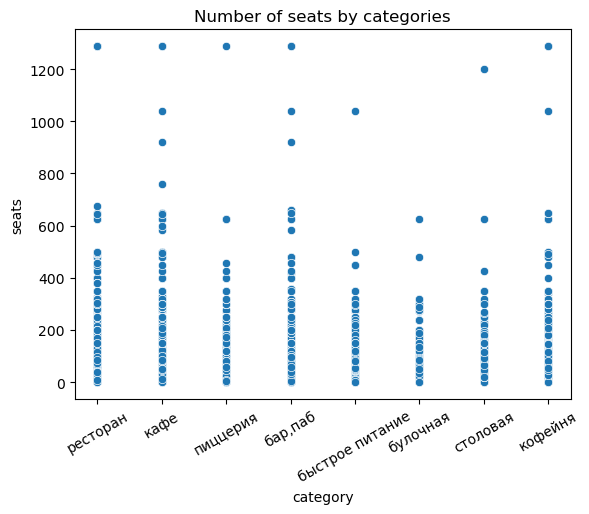

In [24]:
seats = df[df['seats'].notna()]
sns.scatterplot(data=seats, x='category', y='seats')
plt.title('Number of seats by categories')
plt.xticks(rotation=30)
plt.show()

In [25]:
np.percentile(df[df['seats'].notna()]['seats']  , [95, 99])# какое количество мест входит в 95 и 99 перцентиль

array([307., 625.])

### Выводы
-  в данных, скорее всего имеются выбросы или ошибки с нулями: количество  мест более 600 или 800 для баров и пабов маловероятно. Да и и пиццерии на 1200 мест тоже редкость. Вероятно,к количеству мест по ошибке  приписан лишний ноль
- по медианному количеству мест примерно сопоставимы рестораны,пабы и кофейни и столовые: порядка 60-90 мест 


### Задача
- Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете.
- Каких заведений больше?
- Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.

In [26]:
df['chain'].value_counts(normalize=False)

0    5201
1    3205
Name: chain, dtype: int64

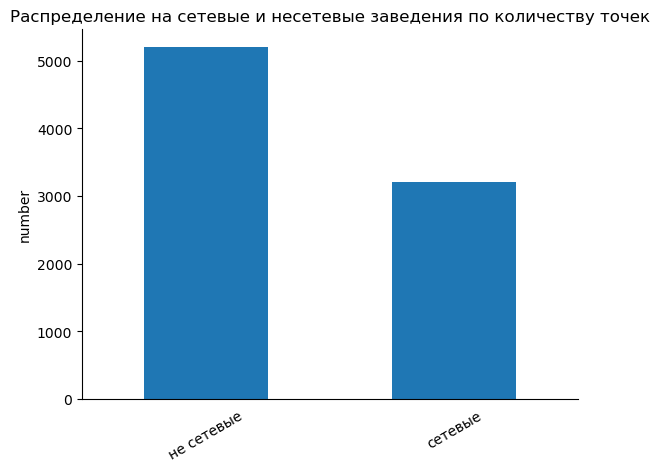

In [28]:
chain = df.groupby('chain', as_index=False)['chain'].count()
chain.index = ['не сетевые', 'сетевые']
chain.plot.bar(legend=False)
plt.title('Распределение на сетевые и несетевые заведения по количеству точек')
plt.xticks(rotation=30)
plt.ylabel('Количество точек в Москве')

plt.tick_params(axis='x', which='both', bottom=False,
                top=False, labelbottom=True)
  
# Selecting the axis-Y making the right and left axes False
plt.tick_params(axis='y', which='both', right=False,
                left=False, labelleft=True)
  
# Iterating over all the axes in the figure
# and make the Spines Visibility as False
for pos in ['right', 'top']:
    plt.gca().spines[pos].set_visible(False)
plt.ylabel('number')
plt.show()


In [27]:
fig = px.histogram(df, x="chain", title='Chain and nonchain catering organisation in Moscow')
fig.update_layout(bargap=0.2,  yaxis_title='Number of points in Moscow', xaxis_title='0 - not chain, 1 - is chain')
fig.show()

In [29]:
# доля сетевых заведений по категориям
chain = df.pivot_table(index='chain', columns='category',values='name', aggfunc='count')
chain = chain / chain.sum()
chain.round(2)

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
chain,,,,,,,,
0,0.78,0.39,0.62,0.67,0.49,0.48,0.64,0.72
1,0.22,0.61,0.38,0.33,0.51,0.52,0.36,0.28


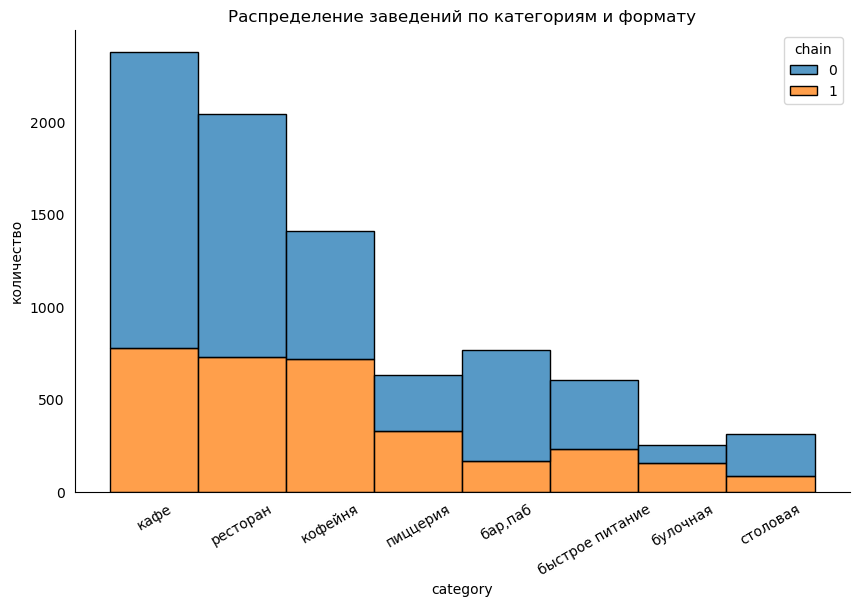

In [30]:
# доля сетевых заведений по категориям
plt.figure(figsize=(10,6))
sns.histplot(df, x='category', hue='chain', multiple='stack')
plt.xticks(rotation=30)
plt.title('Распределение заведений по категориям и формату')

plt.tick_params(axis='x', which='both', bottom=False,
                top=False, labelbottom=True)
  
# Selecting the axis-Y making the right and left axes False
plt.tick_params(axis='y', which='both', right=False,
                left=False, labelleft=True)
  
# Iterating over all the axes in the figure
# and make the Spines Visibility as False
for pos in ['right', 'top']:
    plt.gca().spines[pos].set_visible(False)
plt.ylabel('количество')
plt.show()
plt.show()

### Выводы
-  сетевые заведения составляют 38% от общего числа
- самая больша доля сетевых заведений среди пиццерий (52%) и кофеен (51%)
- самая низкая доля сетевых заведений среди баров и пабов (22%)

### Задача
- Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе.
- Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети?
- Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

In [31]:
chain_points = df[df['chain'] == 1]
chain_points.pivot_table(index='name', columns='category', values='chain', aggfunc='count').fillna("")

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
name,,,,,,,,
1-я Креветочная,,,,1,,,,
10 Идеальных Пицц,,,,,,,3,
18 Грамм,,,,,3,,,
4 Сезона,,,,1,,,,
7 Сэндвичей,,,,,4,,,
...,...,...,...,...,...,...,...,...
Я люблю суши,,,,,,,4,
Ян Примус,1,,,,,,2,
Яндекс Лавка,,,,,,,69,


In [32]:
yan = df[(df['name'] == 'Яндекс Лавка')|(df['name'] =='Яндекс.Лавка')].groupby('name')['chain'].count()
yan

name
Яндекс Лавка    69
Яндекс.Лавка     3
Name: chain, dtype: int64

- по-видимому выявился неявный дубликат Яндекс.Лавка и Яндекс Лавка
- внесем коррекцию в данные

In [33]:
df['name'] = df['name'].str.replace('Яндекс.Лавка', 'Яндекс Лавка')# заменим на единое название Яндекс Лавка

In [34]:
chain_points = df[df['chain'] == 1]
top_chain = chain_points.groupby(['name','category'])['chain'].count().reset_index()\
                                    .sort_values(by='chain', ascending=False).head(15)

fig = px.bar(top_chain, x='name', y='chain', title='ТОР 15 сетевых заведений общественного питания в Москве')
fig.update_layout(xaxis_title='Chaine name', yaxis_title='Number of points in Moscow')
fig.show()

In [35]:
chain_points['name'].value_counts(normalize=True).round(3).reset_index().head(5)# доли  ТОР-5 ведущих сетевых заведений

,index,name
0,Шоколадница,0.037
1,Домино'с Пицца,0.024
2,Додо Пицца,0.023
3,Яндекс Лавка,0.022
4,One Price Coffee,0.022


In [36]:
top_chain

,name,category,chain
1142,Шоколадница,кофейня,119
504,Домино'с Пицца,пиццерия,76
497,Додо Пицца,пиццерия,74
1158,Яндекс Лавка,ресторан,72
206,One Price Coffee,кофейня,71
73,Cofix,кофейня,65
242,Prime,ресторан,49
558,КОФЕПОРТ,кофейня,42
644,Кулинарная лавка братьев Караваевых,кафе,39
978,Теремок,ресторан,36


In [37]:
data = top_chain['category'].value_counts().reset_index()
data

,index,category
0,кофейня,6
1,ресторан,3
2,кафе,3
3,пиццерия,2
4,булочная,1


In [38]:
fig = px.pie(data, values='category', names='index', title='Распределение ТОР 20 сетевых заведений  по категориям')
fig.show()

### Выводы
- на первом месте по количеству точек находится  сеть "Шоколадница"
- среди сетевых заведений лидирующее место занимают кофейни и пиццерии
- все заведения из ТОР-15 хорошо узнаваемые

### Задача
- Какие административные районы Москвы присутствуют в датасете?
- Отобразите общее количество заведений и количество заведений каждой категории по районам.
- Попробуйте проиллюстрировать эту информацию одним графиком.

In [39]:
df['district'].value_counts(normalize=True).round(2)

Центральный административный округ         0.27
Северный административный округ            0.11
Южный административный округ               0.11
Северо-Восточный административный округ    0.11
Западный административный округ            0.10
Восточный административный округ           0.09
Юго-Восточный административный округ       0.08
Юго-Западный административный округ        0.08
Северо-Западный административный округ     0.05
Name: district, dtype: float64

In [40]:
df.pivot_table(index='district', columns='category', values='chain', aggfunc='count', margins=True, margins_name='Total')

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,Total
district,,,,,,,,,
Восточный административный округ,53,25,71,272,105,72,160,40,798
Западный административный округ,50,37,62,239,150,71,218,24,851
Северный административный округ,68,39,58,235,193,77,189,41,900
Северо-Восточный административный округ,63,28,82,269,159,68,182,40,891
Северо-Западный административный округ,23,12,30,115,62,40,109,18,409
Центральный административный округ,364,50,87,464,428,113,670,66,2242
Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
Южный административный округ,68,25,85,264,131,73,202,44,892


In [41]:
df_2 = df.copy()
names = df['district'].unique().tolist()
acronims = ['САО',"СВАО","СЗАО","ЗАО","ЦАО","ВАО","ЮВАО","ЮАО","ЮЗАО"]
for i in range(len(names)):
    df_2['district'] =  df_2['district'].str.replace(names[i], acronims[i])

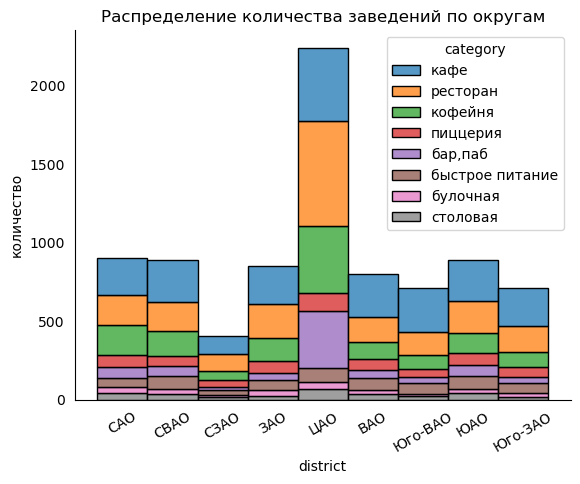

In [42]:
sns.histplot(df_2, x='district', hue='category', multiple='stack')
plt.title('Распределение количества заведений по округам')
plt.xticks(rotation=30)

plt.tick_params(axis='x', which='both', bottom=False,
                top=False, labelbottom=True)
  
# Selecting the axis-Y making the right and left axes False
plt.tick_params(axis='y', which='both', right=False,
                left=False, labelleft=True)
  
# Iterating over all the axes in the figure
# and make the Spines Visibility as False
for pos in ['right', 'top']:
    plt.gca().spines[pos].set_visible(False)
plt.ylabel('количество')
plt.show()


In [43]:
fig = px.histogram(df_2, x='district', color='category',\
                   title='Распределение количества заведений по округам').update_xaxes(categoryorder='total descending')

fig.show()

### Выводы
- в отчёте представлена информация по 9 округам Москвы (нет Новомосковского, Зеленоградского и Троицкого округов)
- больше всего заведений в Центральном округе
- меньше всего заведений в Северо-Западном округе

### Задача
- Визуализируйте распределение средних рейтингов по категориям заведений. 
- Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [44]:
df.groupby('category')['rating'].mean().sort_values(ascending=False)

category
бар,паб            4.387712
пиццерия           4.301264
ресторан           4.290357
кофейня            4.277282
булочная           4.268359
столовая           4.211429
кафе               4.123886
быстрое питание    4.050249
Name: rating, dtype: float64

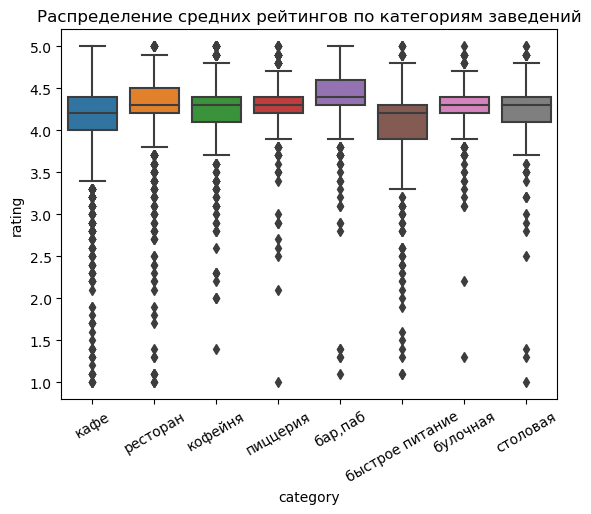

In [45]:
sns.boxplot(data=df, x='category', y='rating')
plt.title('Распределение средних рейтингов по категориям заведений')
plt.xticks(rotation=30)
plt.show()

In [46]:
fig = px.box(df, x='category', y='rating', title='Распределение средних рейтингов по категориям заведений')
fig.show()

### Выводы
- средний рейтинг по всем категориям находится между 4 и 4.5 баллами
- самый высокий у баров, пабов
- самый низкий в категории быстрое питание

### Задача

- Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.

In [47]:
# glbal_link это актуальная работающая внешняя ссылка, которую вы указали в самом начале ноутбука
local_link = r"C:\Users\takhi\Desktop\Яндекс академия\Базы к ноутбукам\История с помощью данных\admin_level_geomap.geojson"
try:
    with open(global_link, 'r', encoding='utf-8') as f:
        ru_json = json.load(f)
except:
    with open(local_link, 'r', encoding='utf-8') as f:
        ru_json = json.load(f)
#print(json.dumps(ru_json, indent=2,ensure_ascii=False, sort_keys=True))

In [48]:
# проверим где какие округа
for i in range(9):    
    print(ru_json['features'][i]['name'])

Восточный административный округ
Северный административный округ
Юго-Западный административный округ
Юго-Восточный административный округ
Южный административный округ
Северо-Восточный административный округ
Центральный административный округ
Северо-Западный административный округ
Западный административный округ


In [49]:
rating_df = df.groupby('district', as_index=False)['rating'].mean().round(2)
rating_df.sort_values(by='rating', ascending=False).reset_index(drop=True)

,district,rating
0,Центральный административный округ,4.38
1,Северный административный округ,4.24
2,Северо-Западный административный округ,4.21
3,Западный административный округ,4.18
4,Южный административный округ,4.18
5,Восточный административный округ,4.17
6,Юго-Западный административный округ,4.17
7,Северо-Восточный административный округ,4.15
8,Юго-Восточный административный округ,4.10


In [50]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=ru_json,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.4,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

m

### Задача

- Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [51]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_sart=15)
marker_cluster = MarkerCluster().add_to(m)
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
    
df.apply(create_clusters, axis=1)
m

### Задача

- Найдите топ-15 улиц по количеству заведений.
- Постройте график распределения количества заведений и их категорий по этим улицам.-
- Попробуйте проиллюстрировать эту информацию одним графиком.

In [52]:
top_streets = df.groupby('street')['name'].count().sort_values(ascending=False).head(15)
df_ts = df[df['street'].isin(top_streets.index)]

In [53]:
fig = px.histogram(df_ts, x='street', color='category',\
                   title="ТОР-15 улиц с распределением заведений по категориям").update_xaxes(categoryorder='total descending')
fig.show()

### Задача

- Найдите улицы, на которых находится только один объект общепита.
- Что можно сказать об этих заведениях?

In [54]:
street_points = df.groupby('street',as_index=False)['name'].count()
one_point = street_points[street_points['name']==1]
one_street = df[df['street'].isin(one_point['street'])]
one_street_region = one_street.groupby(['district'], as_index=False)['name'].count().sort_values(by='name', ascending=False)
display(one_street_region)
one_street_cat = one_street.groupby(['category'], as_index=False)['name'].count().sort_values(by='name', ascending=False)
display(one_street_cat)

,district,name
5,Центральный административный округ,145
3,Северо-Восточный административный округ,55
0,Восточный административный округ,52
2,Северный административный округ,52
8,Южный административный округ,43
6,Юго-Восточный административный округ,39
1,Западный административный округ,35
4,Северо-Западный административный округ,19
7,Юго-Западный административный округ,18


,category,name
3,кафе,160
6,ресторан,93
4,кофейня,84
0,"бар,паб",39
7,столовая,36
2,быстрое питание,23
5,пиццерия,15
1,булочная,8


In [55]:
fig  = px.bar(one_street_region, y='district', x='name',\
              title='Количество улицим с 1 заведением по округам',\
              orientation='h').update_xaxes(categoryorder='total descending')
fig.show()

In [56]:
fig  = px.bar(one_street_cat, x='category', y='name', title='Форматы единственных на улице заведений')\
                                                          .update_xaxes(categoryorder='total descending')
fig.show()

### Выводы
- улиц, на которых находится всего одно заведение больше всего в центральном округе
- среди одиночных заведений больше всего кафе
- реже всего одиночными заведениями на улице являются булочные

### Задача

- Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном.
- Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района.
- Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района.-
- Проанализируйте цены в центральном административном округе и других.
- Как удалённость от центра влияет на цены в заведениях?

In [57]:
actual_bills = df[df['middle_avg_bill'].notna()]

In [58]:
avg_bill = actual_bills.groupby('district',as_index=False)['middle_avg_bill']\
                                              .median().sort_values(by='middle_avg_bill', ascending=False)
avg_bill

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [59]:
fig  = px.bar(avg_bill, x='district', y='middle_avg_bill', title='Средний чек по округам')\
                                                          .update_xaxes(categoryorder='total descending')
fig.show()

In [60]:
category_bill = actual_bills.groupby('category', as_index=False)['middle_avg_bill']\
                                    .median().sort_values(by='middle_avg_bill',ascending=False)
category_bill

,category,middle_avg_bill
0,"бар,паб",1250.0
6,ресторан,1250.0
5,пиццерия,600.0
3,кафе,550.0
1,булочная,450.0
4,кофейня,400.0
2,быстрое питание,375.0
7,столовая,300.0


In [61]:
fig = go.Figure()
fig.add_trace(go.Bar(x=category_bill['category']  ,
                y=category_bill['middle_avg_bill']  ,
                name='China',
                marker_color='darkseagreen'
                ))

fig.update_layout(
    title='Средний чек по категориям',
    xaxis_tickfont_size=14,
    yaxis=dict(
        title='Рубли',
        titlefont_size=16,
        tickfont_size=14,
    ),
    legend=dict(
        x=0,
        y=1.0,
        bgcolor='rgba(255, 120, 255, 0)',
        bordercolor='rgba(55, 205, 55, 0)'
    ),
    barmode='group',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 # gap between bars of the same location coordinate.
)
fig.show()

In [62]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=ru_json,
    data=avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.4,
    legend_name='Средний чек по районам',
).add_to(m)

m

In [63]:
# как выглядит медиана счета с учетом округа и категории заведения
cat_district = actual_bills.pivot_table(index='category', columns='district', values='middle_avg_bill',\
                         aggfunc='median', margins=True, margins_name='Median price')
cat_district

district,Восточный административный округ,Западный административный округ,Северный административный округ,Северо-Восточный административный округ,Северо-Западный административный округ,Центральный административный округ,Юго-Восточный административный округ,Юго-Западный административный округ,Южный административный округ,Median price
category,,,,,,,,,,
"бар,паб",1200.0,1250.0,1250.0,900.0,1000.0,1250.0,925.0,1000.0,1175.0,1250.0
булочная,300.0,600.0,625.0,500.0,200.0,962.5,375.0,500.0,437.5,450.0
быстрое питание,375.0,367.5,300.0,425.0,275.0,450.0,300.0,375.0,400.0,375.0
кафе,450.0,625.0,550.0,475.0,650.0,700.0,400.0,450.0,600.0,550.0
кофейня,400.0,600.0,325.0,325.0,325.0,500.0,250.0,375.0,387.5,400.0
пиццерия,500.0,700.0,650.0,500.0,549.5,1000.0,500.0,500.0,500.0,600.0
ресторан,1000.0,1300.0,1187.5,837.5,1250.0,1250.0,925.0,1050.0,975.0,1250.0
столовая,300.0,300.0,300.0,275.0,300.0,300.0,275.0,305.0,282.5,300.0
Median price,575.0,1000.0,650.0,500.0,700.0,1000.0,450.0,600.0,500.0,750.0


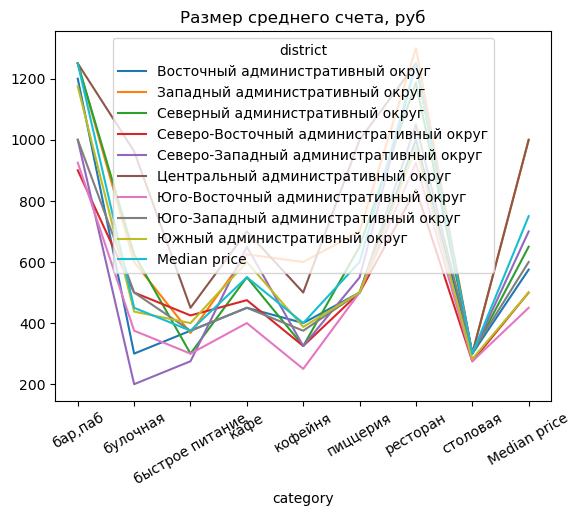

In [64]:
# этот график плохо читается и не пойдет в презентацию
cat_district.plot()
plt.title('Размер среднего счета, руб')
plt.xticks(rotation=30)
plt.show()

In [65]:
# как выглядит медиана счета с учетом категории и  рейтинга заведения
rating_bill = actual_bills.pivot_table(index='rating', columns='category',\
                                       values='middle_avg_bill', aggfunc='median').reset_index().fillna('')
rating_bill.columns = ['rating', 'бар,паб', 'булочная', 'быстрое питание',\
                                       'кафе', 'кофейня', 'пиццерия','ресторан', 'столовая']
rating_bill = rating_bill[rating_bill['rating']>3.5]
rating_bill

,rating,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
18,3.6,800,,370,575,,,300,340
19,3.7,750,225,194.5,375,300,400,375,325
20,3.8,1250,450,425,275,260,525,700,285
21,3.9,,325,362.5,500,280,500,500,270
22,4.0,750,200,325,350,300,549,550,300
23,4.1,1000,525,375,400,375,500,750,300
24,4.2,1000,375,350,450,400,500,900,300
25,4.3,1150,285,387.5,600,350,497.5,1250,300
26,4.4,1250,1100,387.5,600,800,900,1250,270
27,4.5,1250,775,412.5,910,487.5,1000,1550,282.5


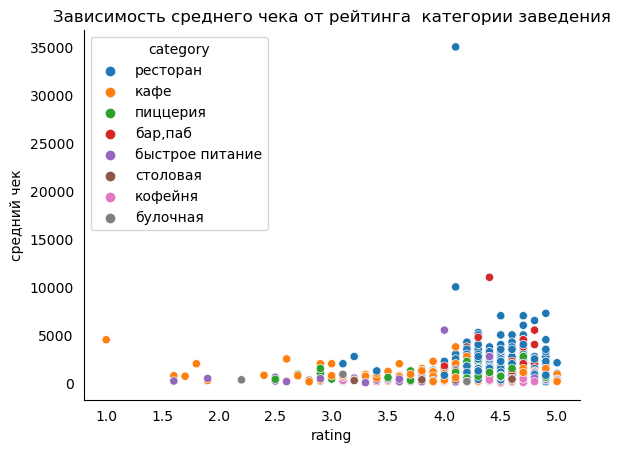

In [66]:
sns.scatterplot(data=actual_bills, x='rating', y='middle_avg_bill', hue='category')
plt.title('Зависимость среднего чека от рейтинга  категории заведения')

plt.tick_params(axis='x', which='both', bottom=False,
                top=False, labelbottom=True)
  
# Selecting the axis-Y making the right and left axes False
plt.tick_params(axis='y', which='both', right=False,
                left=False, labelleft=True)
  
# Iterating over all the axes in the figure
# and make the Spines Visibility as False
for pos in ['right', 'top']:
    plt.gca().spines[pos].set_visible(False)
plt.ylabel('средний чек')
plt.show()


In [67]:
# как выглядит медианный чек в крупнейших сетевых заведенях в зависмости от округа
top_chain_bill = actual_bills[actual_bills['name'].isin(['Домино\'с Пицца', 'Додо Пицца', 'Шоколадница'])]\
                                       .groupby('district',as_index=False)['middle_avg_bill']\
                                        .median().sort_values(by='middle_avg_bill', ascending=False)
top_chain_bill

,district,middle_avg_bill
1,Западный административный округ,528.5
6,Юго-Восточный административный округ,439.0
8,Южный административный округ,432.0
0,Восточный административный округ,418.5
4,Северо-Западный административный округ,418.5
2,Северный административный округ,409.0
3,Северо-Восточный административный округ,404.0
5,Центральный административный округ,400.0
7,Юго-Западный административный округ,392.0


In [68]:
fig = go.Figure()
fig.add_trace(go.Bar(x=top_chain_bill['district']  ,
                y=top_chain_bill['middle_avg_bill']  ,
                name='TOP-15 chains',
                marker_color='darkgoldenrod'
                ))

fig.update_layout(
    title='Средний чек по округам среди ТОР 15 сетевых заведений',
    xaxis_tickfont_size=14,
    yaxis=dict(
        title='Рубли',
        titlefont_size=16,
        tickfont_size=14,
    ),
    legend=dict(
        x=0,
        y=1.0,
        bgcolor='rgba(255, 120, 255, 0)',
        bordercolor='rgba(55, 205, 55, 0)'
    ),
    barmode='group',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 # gap between bars of the same location coordinate.
)
fig.show()

### Выводы
- самый большой средний чек в западном и центральном округах
- в крупных сетевых заведениях медианный чек в ценральном округе падает на предпоследнее место
- самый маленький средний чек в ЮВАО
- по катериям самый выский чек в пабах, барах и ресторанах, самый низкий в столовых
- связь среднего чека и рейтинга малоинформативна


### Задача

- проиллюстрируйте другие взаимосвязи, которые вы нашли в данных.
Например, по желанию исследуйте часы работы заведений и их зависимость от расположения и категории заведения.
- особенности заведений с плохими рейтингами, средние чеки в таких местах и распределение по категориям заведений.

In [69]:
df['is_24/7'].value_counts(normalize=True).round(3)

False    0.902
True     0.098
Name: is_24/7, dtype: float64

In [70]:
hours= df.pivot_table(index='district', columns='is_24/7', values='name', aggfunc='count')\
                                         .reset_index()
hours['is_24 share'] = (hours[True]/hours[False]).round(3)
hours.sort_values(by='is_24 share', ascending=False)

is_24/7,district,False,True,is_24 share
6,Юго-Восточный административный округ,534,95,0.178
0,Восточный административный округ,624,99,0.159
4,Северо-Западный административный округ,324,45,0.139
7,Юго-Западный административный округ,576,74,0.128
1,Западный административный округ,708,77,0.109
3,Северо-Восточный административный округ,751,79,0.105
8,Южный административный округ,750,77,0.103
2,Северный административный округ,772,74,0.096
5,Центральный административный округ,2059,152,0.074


In [71]:
fig = px.histogram(df, x='district', color='is_24/7',\
                   title="Распределение заведений по часам работы").update_xaxes(categoryorder='total descending')
fig.show()

In [72]:
# распределение заведений по категориям и графику работы
cat_hours = df.pivot_table(index='category', columns='is_24/7', values='name', aggfunc='count')\
                                         .reset_index().sort_values(by=True, ascending=False)
cat_hours['is_24 share'] = (cat_hours[True] / cat_hours[False]).round(3)
cat_hours.sort_values(by='is_24 share', ascending=False)

is_24/7,category,False,True,is_24 share
2,быстрое питание,419,151,0.360
3,кафе,1729,274,0.158
1,булочная,224,25,0.112
0,"бар,паб",691,56,0.081
6,ресторан,1825,144,0.079
4,кофейня,1322,76,0.057
5,пиццерия,596,32,0.054
7,столовая,292,14,0.048


In [73]:
fig = px.histogram(df, x='category', color='is_24/7',\
                   title="Распределение заведений по часам работы").update_xaxes(categoryorder='total descending')
                                                                   
fig.show()

- ресторанов, пабов\баров  и кофеен с рейтингом 3 и ниже нет в базе

In [75]:
# доля заведений с низким рейтингом по округам
bad_distr = df.groupby('district')['name'].count().reset_index().merge(df[df['rating'] <=3]\
                                                           .groupby('district')['name'].count(), how='left', on='district')
bad_distr['rating <=3'] = (bad_distr['name_y'] / bad_distr['name_x']).round(3)
bad_distr = bad_distr.sort_values(by='rating <=3', ascending=False)
bad_distr

,district,name_x,name_y,rating <=3
6,Юго-Восточный административный округ,714,50,0.070
3,Северо-Восточный административный округ,891,38,0.043
1,Западный административный округ,851,35,0.041
0,Восточный административный округ,798,30,0.038
7,Юго-Западный административный округ,709,25,0.035
4,Северо-Западный административный округ,409,11,0.027
2,Северный административный округ,900,20,0.022
8,Южный административный округ,892,18,0.020
5,Центральный административный округ,2242,7,0.003


In [76]:
fig = go.Figure()
fig.add_trace(go.Bar(x=bad_distr['district']  ,
                y=bad_distr['name_y']  ,
                name='Bad ratings by districts',
                marker_color='darksalmon'
                ))

fig.update_layout(
    title='Количество заведений с низким рейтингом по округам',
    xaxis_tickfont_size=14,
    yaxis=dict(
        title='Количество точек',
        titlefont_size=16,
        tickfont_size=14,
    ),
    legend=dict(
        x=0,
        y=1.0,
        bgcolor='rgba(255, 120, 255, 0)',
        bordercolor='rgba(55, 205, 55, 0)'
    ),
    barmode='group',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 # gap between bars of the same location coordinate.
)
fig.show()

In [77]:
# доля заведений с низким рейтингом по категориям
bad_cat = df.groupby('category')['name'].count().reset_index().merge(df[df['rating'] <=3]\
                                                           .groupby('category')['name'].count(), how='left', on='category')
bad_cat['rating <=3'] = (bad_cat['name_y'] / bad_cat['name_x']).round(3)
bad_cat.sort_values(by='rating <=3', ascending=False)

,category,name_x,name_y,rating <=3
2,быстрое питание,603,35,0.058
3,кафе,2378,118,0.050
7,столовая,315,7,0.022
6,ресторан,2043,37,0.018
5,пиццерия,633,9,0.014
4,кофейня,1413,18,0.013
0,"бар,паб",765,8,0.010
1,булочная,256,2,0.008


In [78]:
# сравнение среднего чека по категориям для заведений с низким и хорошим рейтингом
bill_diff = actual_bills.pivot_table(index='category', columns='low_rating', values='middle_avg_bill',aggfunc='mean').reset_index()
bill_diff

low_rating,category,False,True
0,"бар,паб",1338.762178,NaN
1,булочная,665.192308,325.000000
2,быстрое питание,448.424242,343.333333
3,кафе,696.952872,1196.666667
4,кофейня,614.210000,NaN
5,пиццерия,788.766667,837.000000
6,ресторан,1367.881731,NaN
7,столовая,336.441341,237.500000


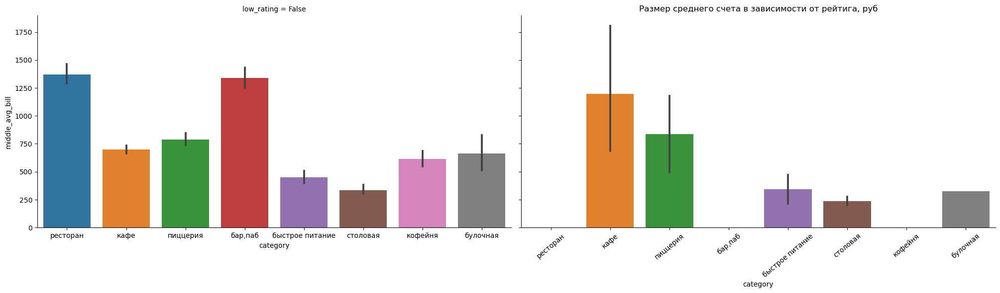

In [79]:
sns.catplot(
    data=actual_bills, x="category", y="middle_avg_bill", col="low_rating",\
    kind="bar", height=5, aspect=2)
plt.xticks(rotation=40)
plt.title('Размер среднего счета в зависимости от рейтига, руб')
plt.show()

In [80]:
actual_bills[['rating', 'middle_avg_bill']].corr(method='spearman')

,rating,middle_avg_bill
rating,1.000000,0.363923
middle_avg_bill,0.363923,1.000000


### Выводы
- самый большая доля круглосуточных заведений в ЮВАО почти 18%, самая низкая в ЦАО 7,5%
- среди типов заведений самая большая доля круглосуточных заведений в категории быстрое питание 36%, самая низкая у столовых 5%
- в целом доля заведений с низким рейтингом незначительна и не превышает 1%
- больше доля низкорейтинговых заведений среди заведений быстрого питания и кафе, ниже всего в булочных
- среди округов,  ЮВАО лидер по доле заведений с низким рейтингом 
- сравнение среднего чека у заведений в зависимости от рейтинга не выявляет явной связи между этими показателями
- имеется слабая положительная корреляция между рейтингом и средним чеком

### Задача <a id=4></a>

Заказчик планирует открыть такую же популярную и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.
Ответьте на следующие вопросы:
- Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
- Есть ли круглосуточные кофейни?
- Какие у кофеен рейтинги? Как они распределяются по районам?
- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?
По желанию вы можете расширить список вопросов для исследования, добавив собственные.
- Постройте визуализации. Попробуйте дать рекомендацию для открытия нового заведения. Это творческое задание: здесь нет правильного или неправильного ответа, но ваше решение должно быть чем-то обосновано. Объяснить свою рекомендацию можно текстом с описанием или маркерами на географической карте.

In [81]:
df['category'].value_counts(normalize=True)

кафе               0.282893
ресторан           0.243041
кофейня            0.168094
бар,паб            0.091006
пиццерия           0.075303
быстрое питание    0.071734
столовая           0.037473
булочная           0.030454
Name: category, dtype: float64

In [82]:
#распределение кофеен по округам
coffee_house = df[df['category'] =='кофейня']
coffee_house = coffee_house.groupby('district')['name'].count().sort_values(ascending=False).reset_index()
coffee_house

,district,name
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


In [83]:
fig = px.pie(coffee_house, values='name',names='district', title='Распределение кофеен по округам')
fig.show()

In [84]:
# доля круглосуточных кофеен
coffee_house = df[df['category'] =='кофейня']
is_24 = coffee_house.groupby('is_24/7')['name'].count().reset_index()
is_24

,is_24/7,name
0,False,1322
1,True,76


In [85]:
coffee_house.head(2)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7,low_rating
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False,False
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False,False


In [86]:
fig = px.pie(is_24, values='name',names='is_24/7', title='Доля круглосуточных кофеен')
fig.show()

In [87]:
# распределение кофеен по округам
fig = px.histogram(coffee_house, x='district', color='is_24/7').update_xaxes(categoryorder='total descending')
fig.show()

In [88]:
# средний рейтинг по округам
coffee_ratings = df.groupby('district', as_index=False)['rating'].agg(['mean', 'median']).round(2).reset_index()
coffee_ratings

,district,mean,median
0,Восточный административный округ,4.17,4.3
1,Западный административный округ,4.18,4.3
2,Северный административный округ,4.24,4.3
3,Северо-Восточный административный округ,4.15,4.2
4,Северо-Западный административный округ,4.21,4.3
5,Центральный административный округ,4.38,4.4
6,Юго-Восточный административный округ,4.10,4.2
7,Юго-Западный административный округ,4.17,4.3
8,Южный административный округ,4.18,4.3


In [90]:
# средний рейтинг заведений по округам
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=ru_json,
    data=coffee_ratings,
    columns=['district', 'mean'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.4,
    legend_name='Средний рейтинг кофеен по округам',
).add_to(m)

m

In [91]:
coffee_cup = df[df['middle_coffee_cup'].notna()]
coffee_prices = coffee_cup.pivot_table(index='district', columns='is_24/7', values='middle_coffee_cup',\
                       aggfunc=(['median'])).round(2)
coffee_prices.columns = ['not_24/7', 'is_24/7']
coffee_prices.reset_index(inplace=True)
coffee_prices.sort_values(by='not_24/7', ascending=False)

,district,not_24/7,is_24/7
5,Центральный административный округ,185.0,256.0
1,Западный административный округ,180.0,265.5
7,Юго-Западный административный округ,180.0,256.0
3,Северо-Восточный административный округ,157.5,213.0
2,Северный административный округ,155.0,305.0
4,Северо-Западный административный округ,150.0,NaN
8,Южный административный округ,149.5,NaN
6,Юго-Восточный административный округ,145.0,NaN
0,Восточный административный округ,135.0,110.0


In [92]:
fig = go.Figure(data=[go.Bar(name='not_24/7', x=coffee_prices['district'], y = coffee_prices['not_24/7']),\
                      go.Bar(name='is_24/7', x=coffee_prices['district'], y = coffee_prices['is_24/7'])])
fig.update_layout(barmode='group', title = 'Медианная цена за чашку кофе с делением по округам и режима работы')
fig.show()

In [93]:
coffee_prices = coffee_cup.pivot_table(index='district', values='middle_coffee_cup',\
                       aggfunc=(['min', 'max', 'mean','median'])).round(2)
coffee_prices.columns = ['min', 'max', 'mean', 'median']
coffee_prices.reset_index(inplace=True)
coffee_prices.sort_values(by='median', ascending=False)

,district,min,max,mean,median
7,Юго-Западный административный округ,95.0,291.0,183.49,197.0
5,Центральный административный округ,60.0,328.0,188.21,190.0
1,Западный административный округ,60.0,300.0,189.64,187.0
3,Северо-Восточный административный округ,60.0,297.0,165.33,162.5
2,Северный административный округ,60.0,325.0,165.09,159.0
4,Северо-Западный административный округ,60.0,270.0,160.46,150.0
8,Южный административный округ,60.0,275.0,157.83,149.5
6,Юго-Восточный административный округ,60.0,375.0,150.77,145.0
0,Восточный административный округ,60.0,1568.0,174.02,135.0


In [94]:
coffee_prices['median'].median()

159.0

In [95]:
fig = go.Figure(data=[go.Bar(name='max', x=coffee_prices['district'], y = coffee_prices['max']),\
                      go.Bar(name='mean', x=coffee_prices['district'], y = coffee_prices['mean']),
                      go.Bar(name='median', x=coffee_prices['district'], y = coffee_prices['median']),
                      go.Bar(name='min', x=coffee_prices['district'], y = coffee_prices['min'])
                     ])
fig.update_layout(barmode='group', title = 'Цена за чашку кофе по округам')
fig.show()

In [96]:
coffee_house = coffee_house.groupby('district')['name'].count().sort_values(ascending=False).reset_index()
all_points = df.groupby('district')['name']\
                                                .count().sort_values(ascending=False).reset_index()

coffee_house_share = all_points.merge(coffee_house, on='district', suffixes=('_all', '_coffee_house') )
coffee_house_share['share'] = (coffee_house_share['name_coffee_house'] / coffee_house_share['name_all']).round(2)
coffee_house_share


,district,name_all,name_coffee_house,share
0,Центральный административный округ,2242,428,0.19
1,Северный административный округ,900,193,0.21
2,Южный административный округ,892,131,0.15
3,Северо-Восточный административный округ,891,159,0.18
4,Западный административный округ,851,150,0.18
5,Восточный административный округ,798,105,0.13
6,Юго-Восточный административный округ,714,89,0.12
7,Юго-Западный административный округ,709,96,0.14
8,Северо-Западный административный округ,409,62,0.15


In [97]:
fig  = px.bar(coffee_house_share, x='district', y='share', title='Доля кофеен по округам')\
                                                          .update_xaxes(categoryorder='total descending')
fig.show()

# Выводы <a id=5></a>

#### Подготовка данных
- при обработке был выявлена ошибка в написании: Яндекс Лавка и Яндекс.Лавка - все названия были приведены к единому Яндекс Лавка
- при анализе числа посадочных мест возникает предположение, что в данных, скорее всего имеются выбросы или ошибки с нулями: количество  мест более 600 или 800 для баров и пабов маловероятно. Да и и пиццерии на 1200 мест тоже редкость. Вероятно,к количеству мест по ошибке  приписан лишний ноль
- в отчёте представлена информация по 9 округам Москвы (не выделены Новомосковский, Зеленоградский и Троицкий округа)

#### Общая информация по базе
- на в базе  представлена информация по 8406 заведениям 8 типов:
   - кафе
   - ресторан
   - кофейня
   - пиццерия
   - бар/паб
   - быстрое питание
   - булочная
   - столовая
- больше всего заведений в Центральном округе
- меньше всего заведений в Северо-Западном округе

- сетевые заведения составляют 38% от общего числа
- самая больша доля сетевых заведений среди пиццерий (52%) и кофеен (51%)
- самая низкая доля сетевых заведений среди баров и пабов (22%)
- самыми распространенными заведениями являются кафе, рестораны и кофейни
- самую маленькую долю по числу заведений имеют булочные и столовые
- по медианному количеству мест  рестораны,пабы, кофейни и столовые примерно сопоставимы: порядка 60-90 мест 
- на первом месте по количеству точек находится  сеть "Шоколадница"
- среди сетевых заведений лидирующее место занимают кофейни и пиццерии
- все заведения из ТОР-15 хорошо узнаваемые бренды
#### Рейтинг
- средний рейтинг по всем категориям находится между 4 и 4.5 баллами
- самый высокий у баров, пабов
- самый низкий в категории быстрое питание
- в целом доля заведений с низким рейтингом (<=3 балла) незначительна и не превышает 1%
- больше доля низкорейтинговых заведений среди заведений быстрого питания и кафе, ниже всего в булочных
- среди округов,  ЮВАО лидер по доле заведений с низким рейтингом
#### Расположение
- по числу заведений лидирует Проспект мира
- улиц, на которых находится всего одно заведение больше всего в центральном округе
- среди одиночных заведений больше всего кафе
- реже всего одиночными заведениями на улице являются булочные
#### Средний чек
- самый большой средний чек в западном и центральном округах
- в крупных сетевых заведениях медианный чек в ценральном округе падает на предпоследнее место
- самый маленький средний чек в ЮВАО
- по катериям самый высокий средний чек в пабах, барах и ресторанах, самый низкий в столовых
- связь среднего чека и рейтинга малоинформативна
- имеется слабая положительная корреляция между рейтингом и средним чеком
#### Режим работы
- самый большая доля круглосуточных заведений в ЮВАО почти 18%, самая низкая в ЦАО 7,5%
- среди типов заведений самая большая доля круглосуточных заведений в категории быстрое питание 36%, самая низкая у столовых 5%

#### Анализ кофеен

- Число кофеен 1413, на их долю приходится примерно 17% от общего числа заведений
- самая крупная сеть кофеен "Шоколадница" с долей 
- по абсолютному числу больше всего кофеен в ЦАО, где они составляют 19%, но самая большая доля кофеен в САО - 21%
- примерно 5% кофеен работают круглосуточно
- средний и медианный рейтиг кофеен выше 4 баллов: максималный в ЦАО 4.4 балла, минимальный в ЮВАО 4.1 бал.
- средняя стоимость чашки кофее зависит от округа и режим работы: самая высокая в ЦАО, самая низкая в ЮВАО. В заведениях с круг
- кофе в заведениях с круглостучным режимом работы дороже чем в обычных

####  Рекомендации
- с точки зрения критериев для выбора локации можно ориентироваться на долю кофеен в округе, рейтинг и средний чек 
- Для старта можно рассматривать СВАО или СЗАО:
    - Здесь доля кофеен меньше, чем у лидеров (значит есть потенциал для развития форамата)
    - стоимость среднего чека также на уровне среднего по городу
    - кофейни в этих округах имеют хорошие рейтинги
    - на старте можно начать с обычного режими работы
- при открытии можно оринтироваться на цену за чашку кофе чуть ниже медианы, например 150 рублей(медиана по городу 160 рублей)
- рассмотреть целесообразность открытия заведения, на улицах, где имеется только одно или вообще нет заведений, принимая во внимание количестов потенциальных клиентов.